# Box Model - flopy

## Model Description 
This intially constructs the 2D (heterogeneous) steady state box model that you built for your BoxModel_Manual assignment

#### Dimensions: 
- 25 by 25 by 1
- dx = dy = 100 m
- dz = 10 m  

#### Subsurface Properties: 
- Heterogeneous 
- K = 1.0 m/day in x, y and z with a 5x5 inclusion with K = 0.1 m/day centered in the domain.  
- Porosity = 0.35
- Specific yield = 0.3
- Storage coefficient=0.001  

#### Boundary Conditions: 
 - Right boundary is constant head of 10 m relative to the datum, which is located at the bottom of the domain.  
 - Left boundary is a constant head of 20 m relative to the datum, which is located at the bottom of the domain. 

## 1. Setup the environment

In [470]:
#the basics
import flopy
import numpy as np
import pandas as pd
import matplotlib as mp
import os

#additional analysis tools
import flopy.utils.binaryfile as bf
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import csv

#jupyter specific--included to show plots in notebook
%matplotlib inline 

## 2. Create the model object

In [471]:
#Look at current directory and set to whatever main path desired

print('Current Directory:\n' + os.getcwd())
os.chdir(r'C:\Users\Dave\Documents\UA Class Documents\S2021\GW Modelling\WessnerRepo')
moddir = os.getcwd()+'\mf2005'
print(moddir)

Current Directory:
C:\Users\Dave\Documents\UA Class Documents\S2021\GW Modelling\WessnerRepo\HWModels\Model_21
C:\Users\Dave\Documents\UA Class Documents\S2021\GW Modelling\WessnerRepo\mf2005


In [472]:
###THIS ISN'T USED IN MY VERSION###
#modelname = "BoxModel_flopy"
#moddir="D:/tyferre/frequent/GitHub/Git_GW_Modeling_Spring2021/Course_Materials/Assignments/mf2005"
#moddir = cwd + '\mf2005'
#m = flopy.modflow.Modflow(modelname, exe_name = moddir)

In [473]:
K_incl = [0.01,0.1]   #K inclusion values
K_incl = K_incl+list(np.linspace(1,9,9))+list(np.linspace(10,100,11))
print(K_incl)
nK = len(K_incl)               #number of K values for the inclusions

model_names = ['Model_'+str(i) for i in range(nK)]
mod_dict = {}
for name in model_names:
    mod_dict.update({name:flopy.modflow.Modflow(name, exe_name=moddir, model_ws = cwd + '\HWModels\{}'.format(name))})
print(nK)

[0.01, 0.1, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 19.0, 28.0, 37.0, 46.0, 55.0, 64.0, 73.0, 82.0, 91.0, 100.0]
22


In [474]:
print([name for name in os.listdir() if os.path.isdir(os.path.join(os.getcwd(),name))])

['.idea', '.ipynb_checkpoints', 'HW 1', 'HW3_BoxModel_FloPy', 'HWModels', 'venv']


In [475]:
#optional delete old run files
run = 'n'
if run == 'y':
    # file_extensions = ['.dis','.bas','.lpf','.oc','.pcg','.wel']
    file_extensions = ['.dis','.bas','.bcf','.oc','.pcg']
    for ext in file_extensions:
        os.remove(modelname + ext)

## 3. Setup the discretization (DIS package)

For more details on DIS package inputs refer to : https://flopy.readthedocs.io/en/3.3.2/source/flopy.modflow.mfdis.html 

#### 3.1 Spatial discretization

In [476]:
nrow = 25 #number of rows
ncol = 25 #number of columns
nlay = 1  #number of layers

dx= 100 #width of grid cells in x direction 
dy= 100 #width of grid cells in y direction 

Lx = ncol*dx  #width of domain in x
Ly = nrow*dy #width of domain in y
ztop = 10.    #top elevation 
zbot = 0.     #bottom elevation

dz = (ztop - zbot) / nlay #cell height in z direction

#### 3.2 Temporal discretization 

In [477]:
nper = 1 #number of stress periods 
steady = [True] #list noting the stress period type

#### 3.3 Create DIS object

In [478]:
#create flopy discretization object, length and time are meters (2) and days (4)
for model in model_names:
    dis = flopy.modflow.ModflowDis(model=mod_dict[model], nlay=nlay, nrow=nrow, ncol=ncol, 
                                   delr=dx, delc=dy, top=ztop, botm=zbot, 
                                   itmuni = 4, lenuni = 2, 
                                   nper=nper, steady=steady)

#### 3.4 Plot the grid

For help on this function see: https://flopy.readthedocs.io/en/3.3.2/source/flopy.plot.plotutil.html

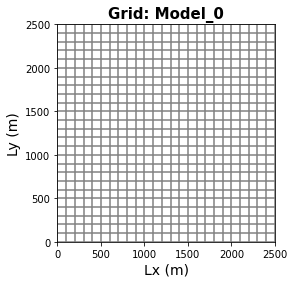

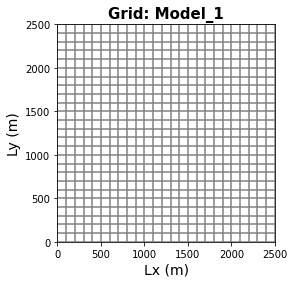

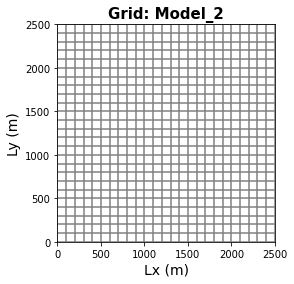

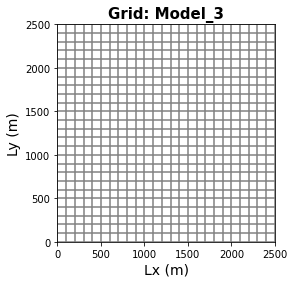

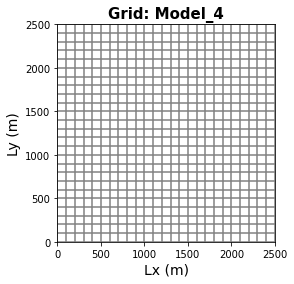

...

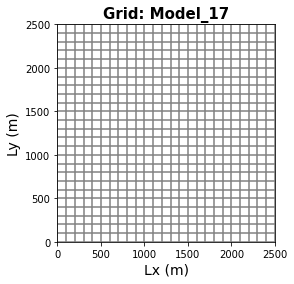

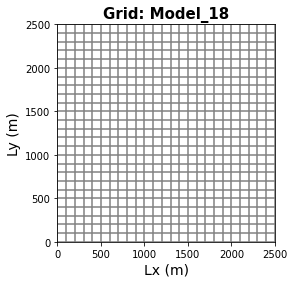

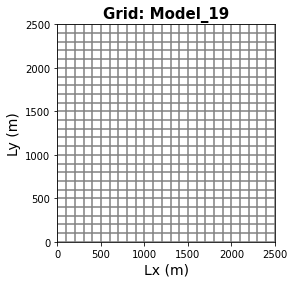

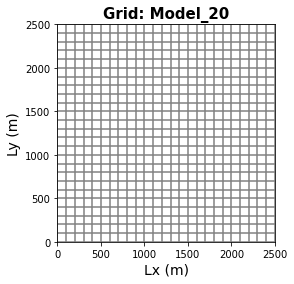

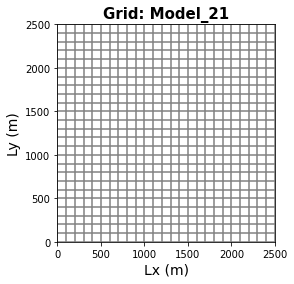

In [479]:
#use flopy to plot the grid of model 'm'
for model in model_names:
    modelmap = flopy.plot.PlotMapView(model=mod_dict[model], layer=0)
    grid = modelmap.plot_grid() 
    plt.xlabel('Lx (m)',fontsize = 14)
    plt.ylabel('Ly (m)',fontsize = 14)
    plt.title('Grid: ' + str(model), fontsize = 15, fontweight = 'bold')
    plt.show()

## 4. Setup constant head boundaries, active cells and initial heads (BAS Package)

For more details on the BAS package see: https://flopy.readthedocs.io/en/3.3.2/source/flopy.modflow.mfbas.html

#### 4.1 Define cell activity: IBOUND 

In [480]:
#create ibound as array of ints = 1
ibound = np.ones((nlay, nrow, ncol), dtype=np.int32) #integer array of dim (z,y,x), makes all cells active     

#set constant head boundary on the left
ibound[:,:,0] = -1          #replace leftmost column (all zs, all ys, first x) with -1 to indicate constant head 
ibound[:,:,-1] = -1          #replace leftmost column (all zs, all ys, first x) with -1 to indicate constant head 

#print("ibound values: \n", ibound)

#### 4.2 Define starting heads 

In [481]:
#setup initial heads as 1 everywhere and 7 on the left boundary 
H_init = np.ones((nlay, nrow, ncol), dtype=np.float32)  #float array (i.e. decimal), sets all heads to 1.0
H_init[:, :, 0] = 20    #replace first (left) col with desired head value
H_init[:, :, -1] = 10    #replace first (left) col with desired head value

#print("starting head values: \n", H_init)

#### 4.3 Create BAS object

In [482]:
#create flopy bas object
for model in model_names:
    bas = flopy.modflow.ModflowBas(model = mod_dict[model], ibound=ibound, strt=H_init)

#### 4.4 Plot the grid and ibound

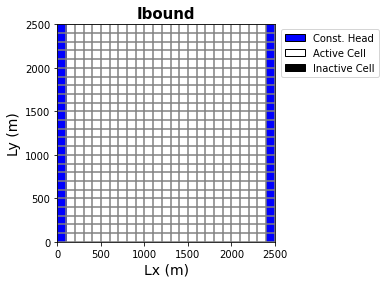

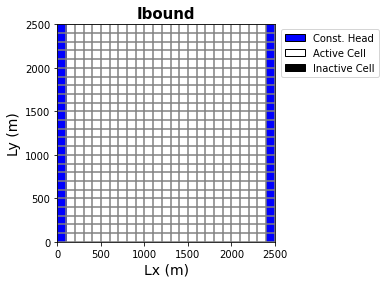

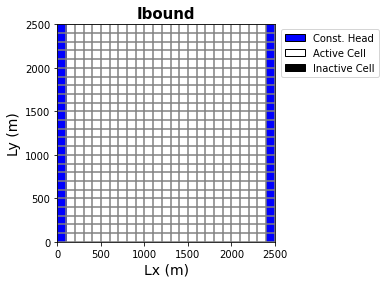

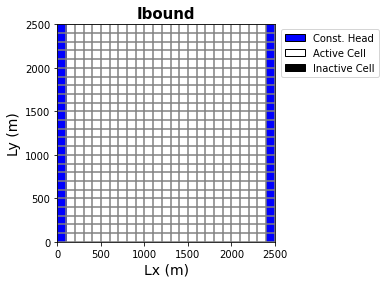

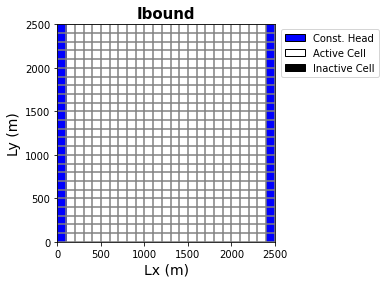

...

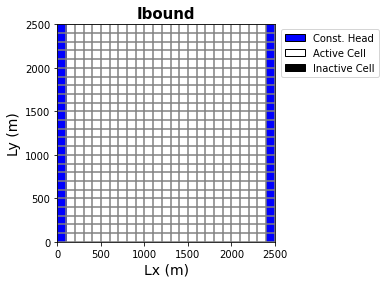

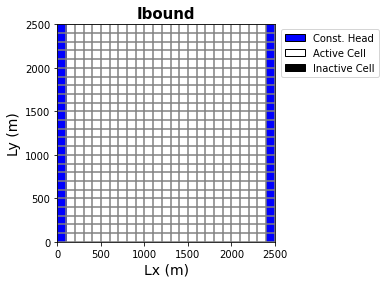

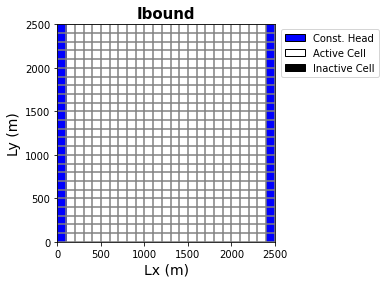

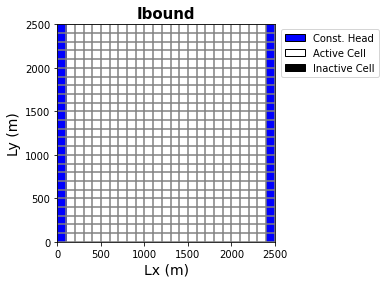

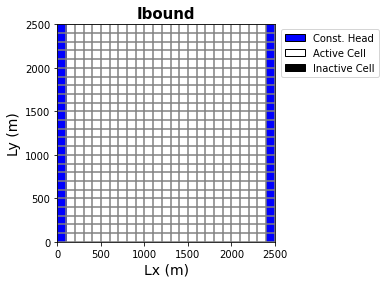

In [483]:
#plot grid and ibound
for model in model_names:
    modelmap = flopy.plot.PlotMapView(model=mod_dict[model], layer=0)
    grid = modelmap.plot_grid()
    ib = modelmap.plot_ibound()
    #add labels and legend
    plt.xlabel('Lx (m)',fontsize = 14)
    plt.ylabel('Ly (m)',fontsize = 14)
    plt.title('Ibound', fontsize = 15, fontweight = 'bold')
    plt.legend(handles=[mp.patches.Patch(color='blue',label='Const. Head',ec='black'),
                       mp.patches.Patch(color='white',label='Active Cell',ec='black'),
                       mp.patches.Patch(color='black',label='Inactive Cell',ec='black')],
                       bbox_to_anchor=(1.5,1.0))
    plt.show(modelmap)

## 5. Setup Layer Properties  (LPF Package)

For more details on LPF package see: https://flopy.readthedocs.io/en/3.3.2/source/flopy.modflow.mflpf.html

#### 5.1 Set layer properties

In [484]:
K_horiz = 1.    #horizontal hydraulic conductivity 
K_vert = 1      #assign vertical hydraulic conductivity (along z axis)
n = 0.35        #assign porosity
Ss = 0.001      #assign storage coefficient
Sy = 0.3        #assign specific yield
uncnf = 0       #0=confined, >0 = unconfined

#### 5.2 Make LPF object

In [485]:
#assigns horizontal and vertical Ks and saves cell-by-cell budget data
# lpf = flopy.modflow.ModflowLpf(m, laytyp=uncnf, hk=K_horiz, 
#                                vka=K_vert, ss=Ss,
#                                sy=Sy,storagecoefficient=True, ipakcb=53) 


## 5b. Setup Cell-byCell Properties  (BCF Package)

For more details on LPF package see: https://flopy.readthedocs.io/en/3.3.2/source/flopy.modflow.mfbcf.html

#### 5b.1 Set cell properties and show K in top layer

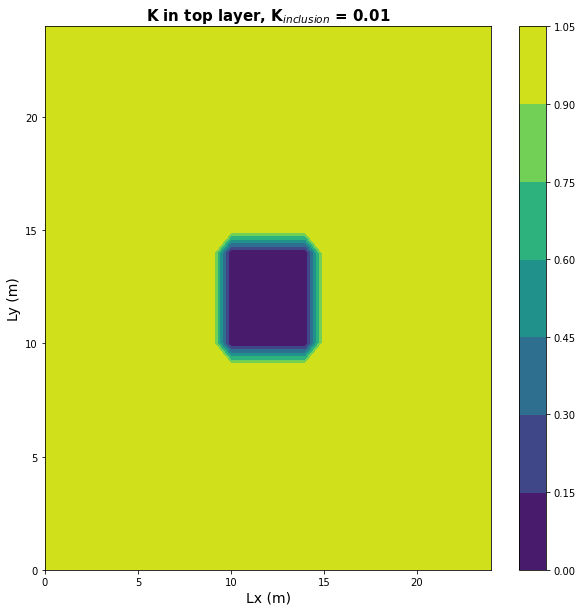

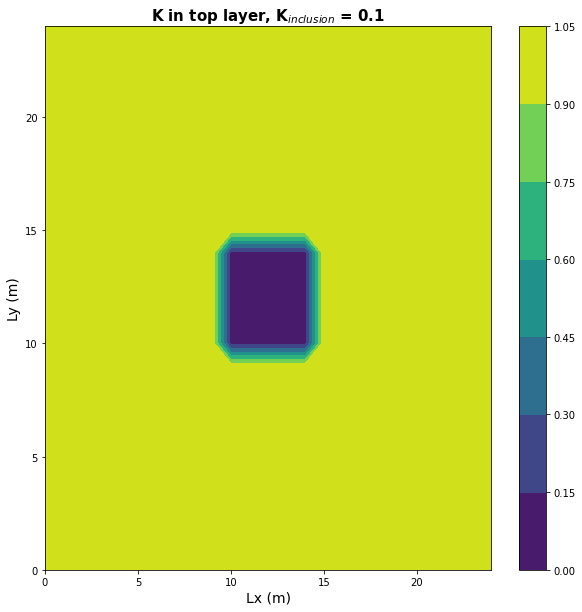

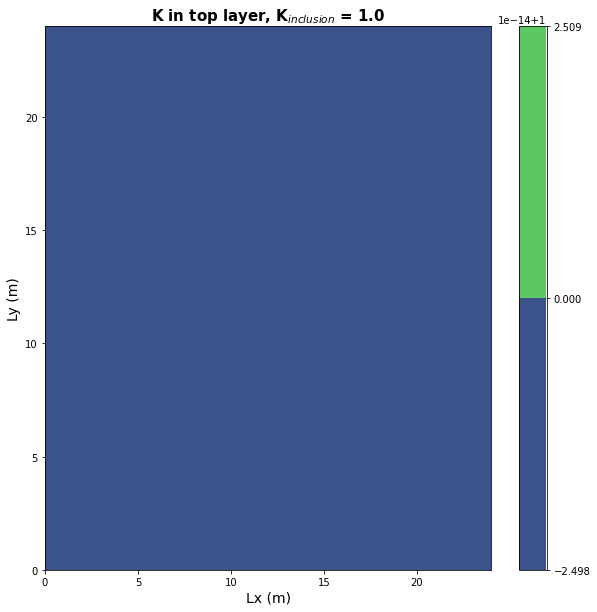

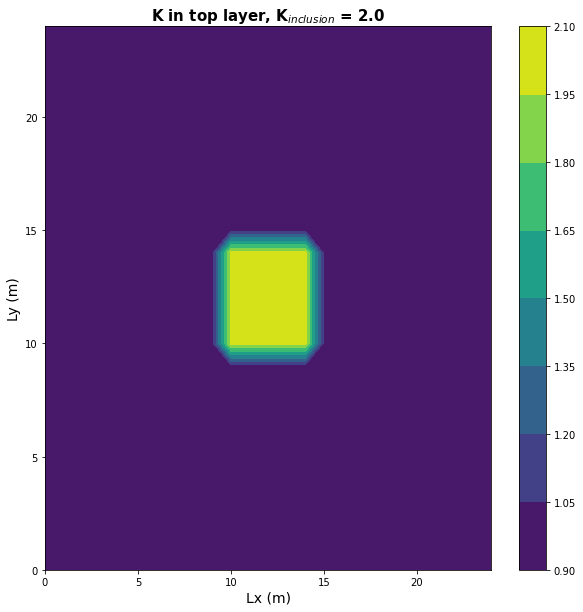

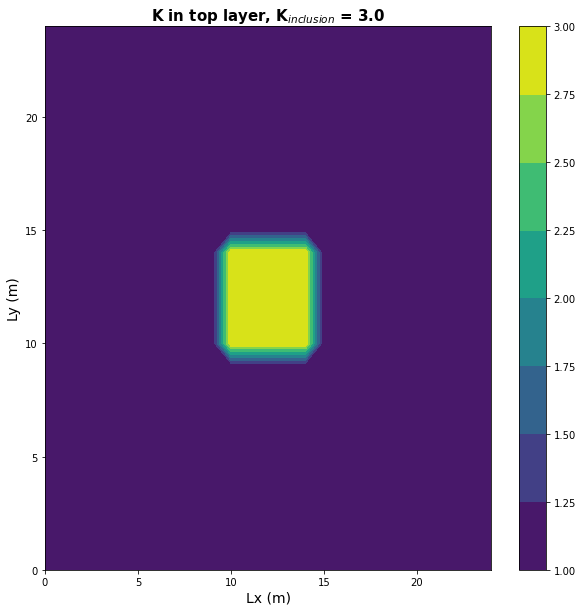

...

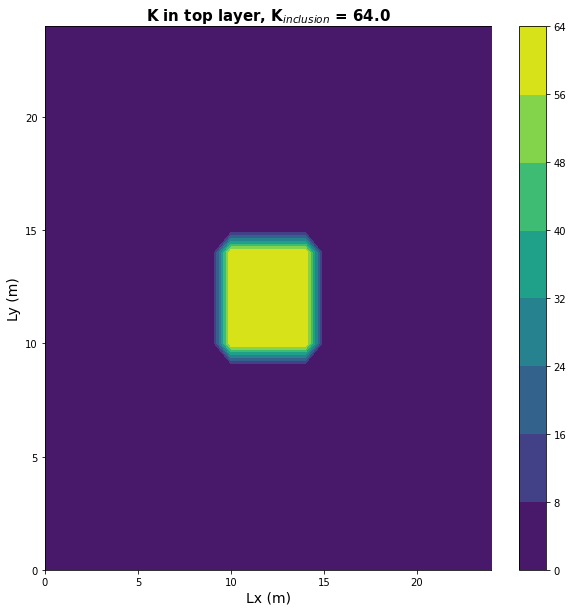

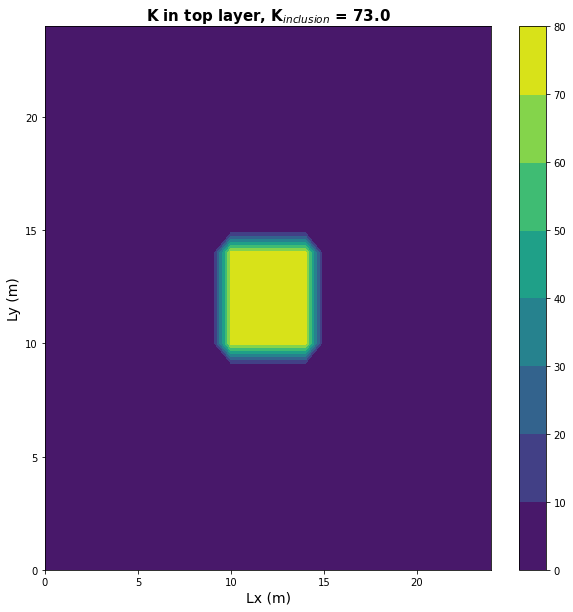

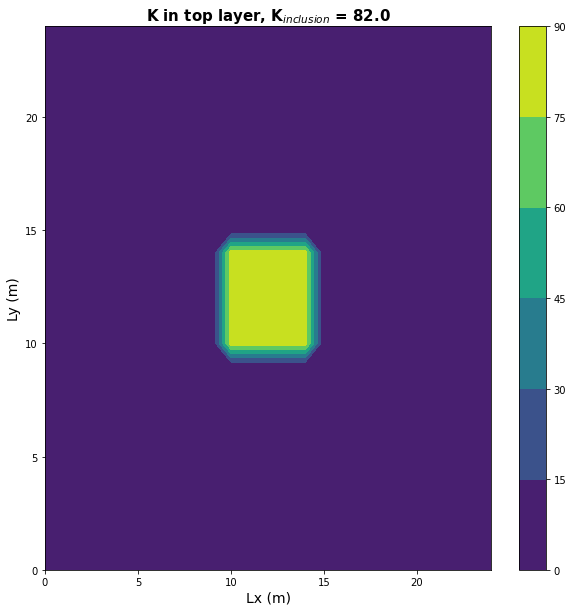

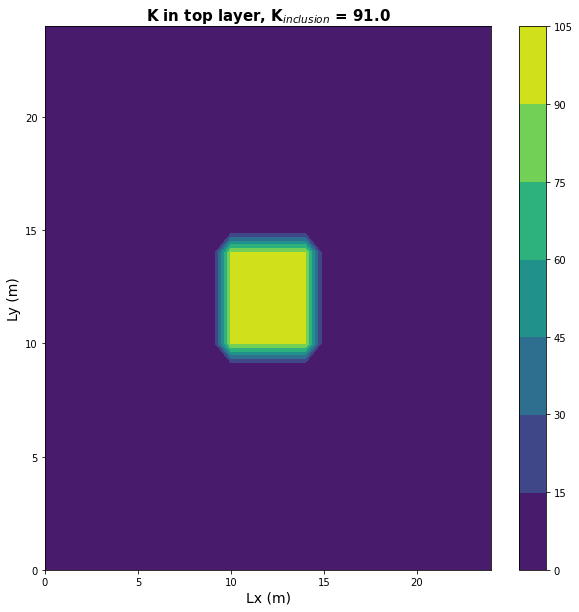

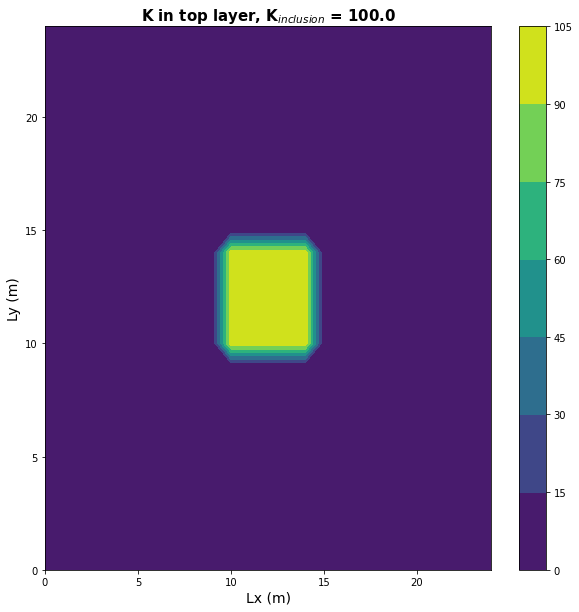

In [486]:
K_vals = np.zeros((ncol,nrow,nlay,nK))
K_vals[:,:,:,:] = 1             # homoogeneous background hydraulic conductivity 
for index in range(nK):
    K_vals[10:15,10:15,:,index] = K_incl[index]  #Generate matrices for all Ks in K_incl
#K_vals[10:15,10:15,:] = 0.1   # low K inclusion

n = 0.35        #assign porosity
Ss = 0.001      #assign storage coefficient
Sy = 0.3        #assign specific yield
uncnf = 0       #0=confined, >0 = unconfined

#plot K values in top layer
for index in range(nK):
    fig1 = plt.figure(figsize=(10,10)) #create 10 x 10 figure
    plt.xlabel('Lx (m)',fontsize = 14)
    plt.ylabel('Ly (m)',fontsize = 14)
    plt.title('K in top layer, ' + r'K$_{inclusion}$ = ' + str(K_incl[index]), fontsize = 15, fontweight = 'bold')
    plt.contourf(K_vals[:,:,0,index])
    plt.colorbar()
    plt.show()

#### 5b.2 Make BCF object

In [487]:
#assigns horizontal and vertical Ks and saves cell-by-cell budget data
for index in range(nK):
    m = mod_dict[model_names[index]]
    bcf = flopy.modflow.ModflowBcf(m, ipakcb=53, intercellt=0, laycon=3, trpy=1.0, hdry=-1e+30, iwdflg=0, wetfct=0.1, iwetit=1, ihdwet=0, tran=1.0, hy=K_vals[:,:,0,index], vcont=1.0, sf1=Ss, sf2=Sy, wetdry=-0.01, extension='bcf', unitnumber=None, filenames=None) 


## 6. Setup outputs by stress period (OC Package)
For more details on OC Package: https://flopy.readthedocs.io/en/3.3.2/source/flopy.modflow.mfoc.html

#### 6.1 Setup outputs

In [488]:
#create oc stress period data. 
#(0,0) tells OC package to save data for stress period 1, time step 1.
spd = {(0,0):['print head', 'print budget', 'save head', 'save budget']} #create a dictionary for stress period data, where key (0,0) is associated with value ['print...'] 

print("oc stress period data: \n", spd)

oc stress period data: 
 {(0, 0): ['print head', 'print budget', 'save head', 'save budget']}


#### 6.2 Make OC object 

In [489]:
for model in model_names:
    oc = flopy.modflow.ModflowOc(model = mod_dict[model], stress_period_data=spd, compact=True)

## 7. Set the numerical solver (PCG Package)

We are using the Preconditioned Conjugate Gradient package:

Additionally, MODFLOW online describes these solvers: https://water.usgs.gov/ogw/modflow/MODFLOW-2005-Guide/index.html?oc.htm

And Flopy documents its communication with the PCG MODFLOW package: http://modflowpy.github.io/flopydoc/mfpcg.html

#### 7.1 Make the PCG object

In [490]:
for model in model_names:
    pcg = flopy.modflow.ModflowPcg(model=mod_dict[model])

## 8. Add wells for the constant flux boundary (WEL Package)
For more details on the WEL package see: http://modflowpy.github.io/flopydoc/mfwel.html

#### 8.1 Setup the well parameters (use this to set a defined flux boundary)

In [491]:
Q_in = -6.25                         #total flow crossing right boundary (m3/day)
Q_cell = Q_in / nrow                 #flow entering each cell (m3/day)
fluxes = np.zeros((nrow,4))          #create array of zeros (# of rows, # of parameters: [lay, row, col, flux])
for i in range(nrow):                #iterate over rows & assign constant flux to each cell in leftmost column
    fluxes[i,:] = [0,i,ncol-1,Q_cell]     #[lay, row, col, flux]
#print(fluxes)

sp_fluxes = {0: fluxes}              #create a dictionary with entries for each stress period

#print(sp_fluxes)

#### 8.2 Make the WEL object

In [492]:
wel = flopy.modflow.mfwel.ModflowWel(m, stress_period_data=sp_fluxes)  #create object for WEL package

## 9. Write inputs and run the model 

#### 9.1 Write Inputs

In [493]:
for model in model_names:
    m = mod_dict[model]
    m.write_input()
#m.write_input()    #uses the package objects created above to actually write the text files, 
                    #and saves to folder that this script is in
                    #after this step you should see the files appear in your folder


#### 9.2 Run the model

In [494]:
for model in model_names:
    m = mod_dict[model]
    success, mfoutput = m.run_model(pause=False, report=True)
    if not success:
        raise Exception('MODFLOW did not terminate normally.')

FloPy is using the following  executable to run the model: C:\Users\Dave\Documents\UA Class Documents\S2021\GW Modelling\WessnerRepo\mf2005.exe

                                  MODFLOW-2005     
    U.S. GEOLOGICAL SURVEY MODULAR FINITE-DIFFERENCE GROUND-WATER FLOW MODEL
                             Version 1.11.00 8/8/2013                        

 Using NAME file: Model_0.nam 
 Run start date and time (yyyy/mm/dd hh:mm:ss): 2021/01/31 18:36:20

 Solving:  Stress period:     1    Time step:     1    Ground-Water Flow Eqn.
 Run end date and time (yyyy/mm/dd hh:mm:ss): 2021/01/31 18:36:20
 Elapsed run time:  0.055 Seconds

  Normal termination of simulation
FloPy is using the following  executable to run the model: C:\Users\Dave\Documents\UA Class Documents\S2021\GW Modelling\WessnerRepo\mf2005.exe

                                  MODFLOW-2005     
    U.S. GEOLOGICAL SURVEY MODULAR FINITE-DIFFERENCE GROUND-WATER FLOW MODEL
                             Version 1.11.00 8/8/2013      

 Using NAME file: Model_14.nam 
 Run start date and time (yyyy/mm/dd hh:mm:ss): 2021/01/31 18:36:22

 Solving:  Stress period:     1    Time step:     1    Ground-Water Flow Eqn.
 Run end date and time (yyyy/mm/dd hh:mm:ss): 2021/01/31 18:36:22
 Elapsed run time:  0.031 Seconds

  Normal termination of simulation
FloPy is using the following  executable to run the model: C:\Users\Dave\Documents\UA Class Documents\S2021\GW Modelling\WessnerRepo\mf2005.exe

                                  MODFLOW-2005     
    U.S. GEOLOGICAL SURVEY MODULAR FINITE-DIFFERENCE GROUND-WATER FLOW MODEL
                             Version 1.11.00 8/8/2013                        

 Using NAME file: Model_15.nam 
 Run start date and time (yyyy/mm/dd hh:mm:ss): 2021/01/31 18:36:22

 Solving:  Stress period:     1    Time step:     1    Ground-Water Flow Eqn.
 Run end date and time (yyyy/mm/dd hh:mm:ss): 2021/01/31 18:36:22
 Elapsed run time:  0.032 Seconds

  Normal termination of simulation
FloPy is using th

## 10. Plot the results  

# DAVE'S COMBO WRITE-AND-READ-AND-GRAPH-AND-STUFF

In [495]:
#CWD Check
os.getcwd()

'C:\\Users\\Dave\\Documents\\UA Class Documents\\S2021\\GW Modelling\\WessnerRepo'

In [496]:
#Stores all head arrays within a dictionary and reverts back to original CWD
head_dict = {}
flux_dict = {}
frf_dict = {}
fff_dict = {}

origin = 'C:\\Users\\Dave\\Documents\\UA Class Documents\\S2021\\GW Modelling\\WessnerRepo'

for model in model_names:
    os.chdir(origin)
    path = os.getcwd()+'\\HWModels\\'+model
    #print(path)
    os.chdir(path)
    headobj = bf.HeadFile(model+'.hds')
    times = headobj.get_times()
    head_dict.update({model:headobj.get_data(totim=times[-1])})
    
    #Water Budget portion
    budgobj = bf.CellBudgetFile(model+'.cbc')   #reads the cell budget file    
    frf = budgobj.get_data(text='flow right face', totim=1.0) #returns an array of flow rates for right face of cells
    fff = budgobj.get_data(text='flow front face', totim=1.0) #returns an array of flow rates for front face of cells     

    flux_dict.update({model:np.squeeze(frf)})
    frf_dict.update({model:frf})
    fff_dict.update({model:fff})
    
os.chdir(origin)

In [497]:
#Writes csv's
for model in model_names:
    os.chdir(origin+'\\HWModels\\'+model)
    with open('FP_heads_{}.csv'.format(model),'w',newline='') as csvfile:
        writer = csv.writer(csvfile, delimiter=',')
        for i in range(len(head_dict[model][0,:,0])):
            writer.writerow(head_dict[model][0,i,:])

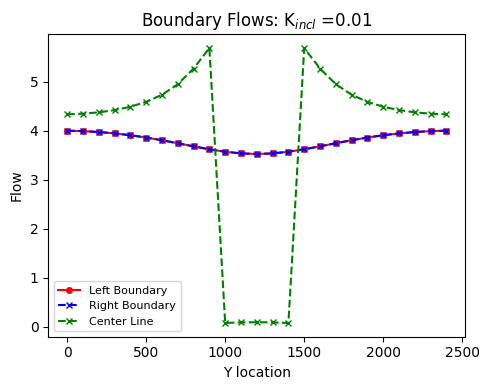

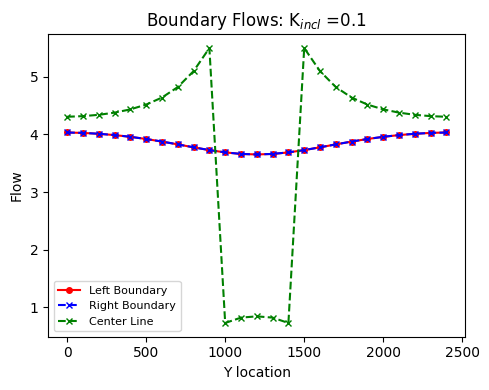

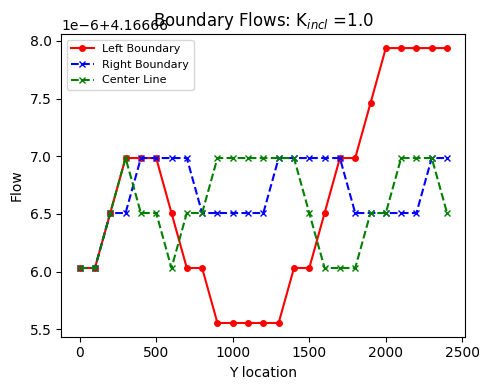

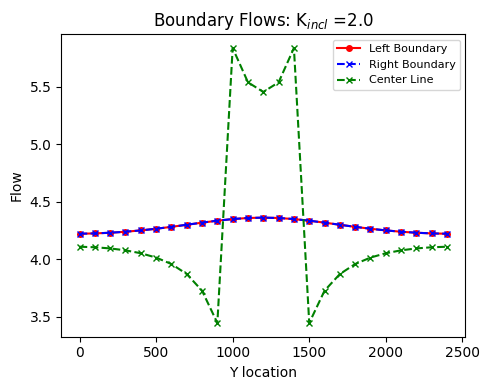

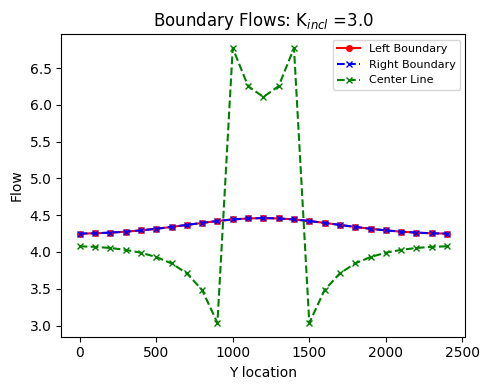

...

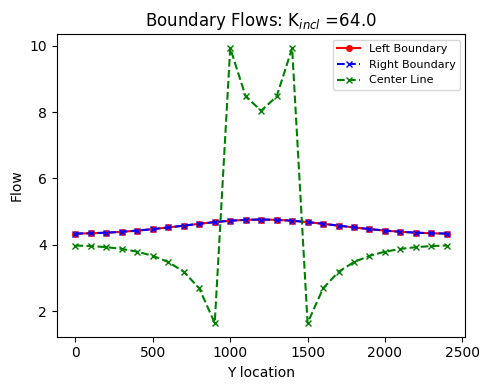

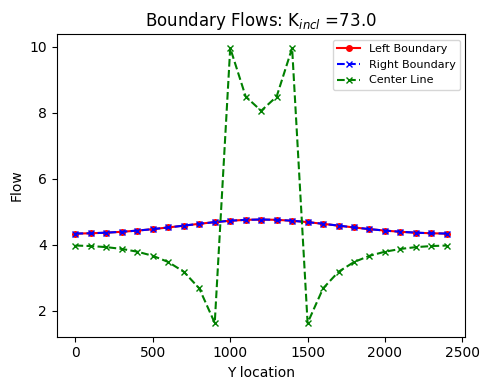

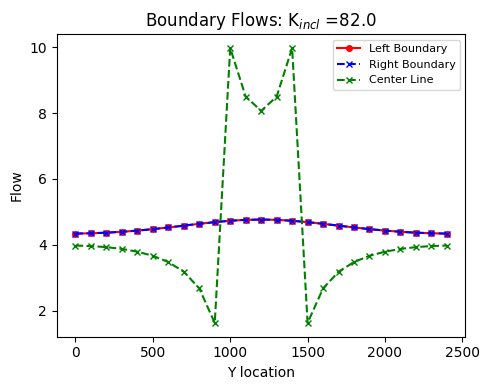

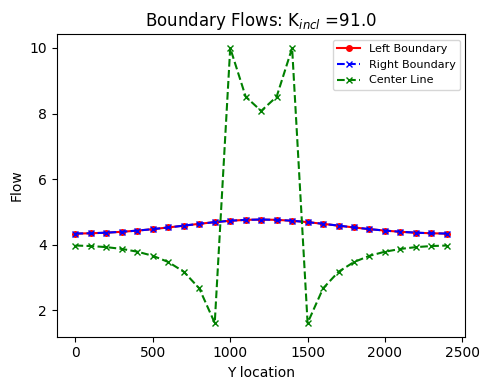

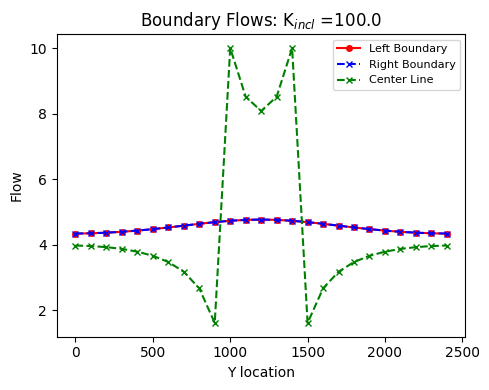

In [498]:
#Plots fluxes
x = np.arange(0,ncol*dx,dx)     #Setup x-axes

for model in model_names:
    #Grab Model Flux Values at Left/Right/Center
    leftflux = flux_dict[model][:,0]
    rightflux = flux_dict[model][:,-2]
    cenflux = flux_dict[model][:,13]
    #Build Plot
    boundary_q = plt.figure(figsize=(5,4),dpi=100,facecolor='w')
    plt.plot(x,leftflux,marker='o', color='red', markersize=4, linestyle='-',label="Left Boundary")
    plt.plot(x,rightflux,marker='x', color='blue', markersize=4, linestyle='--',label="Right Boundary")
    plt.plot(x,cenflux,marker='x', color='green', markersize=4, linestyle='--',label="Center Line")
    plt.xlabel('Y location')
    plt.ylabel('Flow')
    plt.title(r'Boundary Flows: K$_{incl}$ ='+'{}'.format(K_incl[model_names.index(model)]))
    plt.legend(fontsize=8)
    boundary_q.tight_layout()
    plt.show()
    

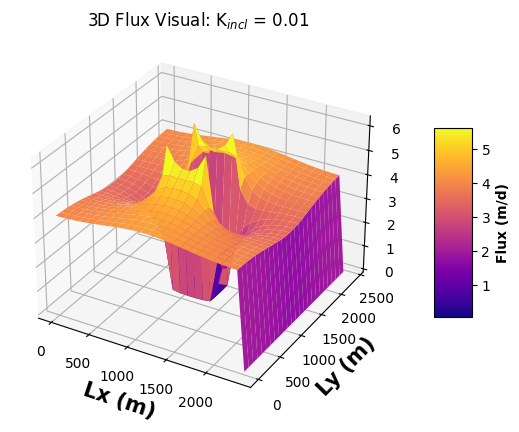

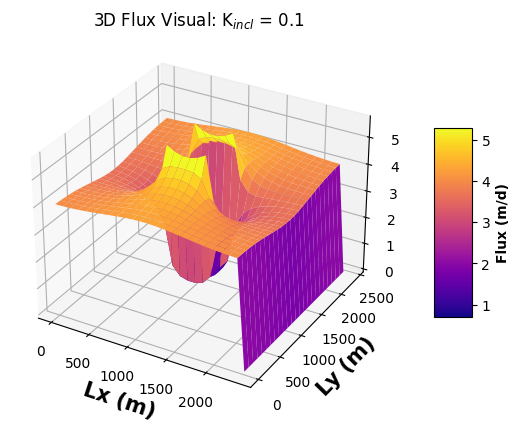

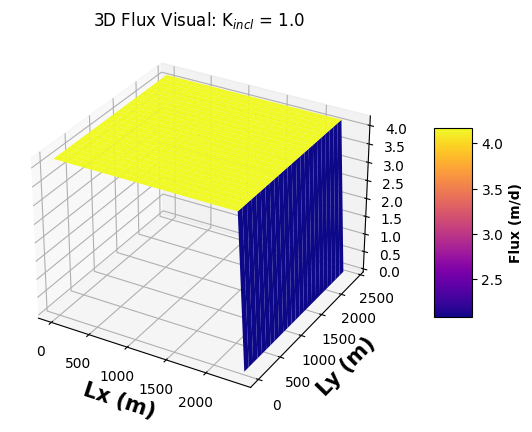

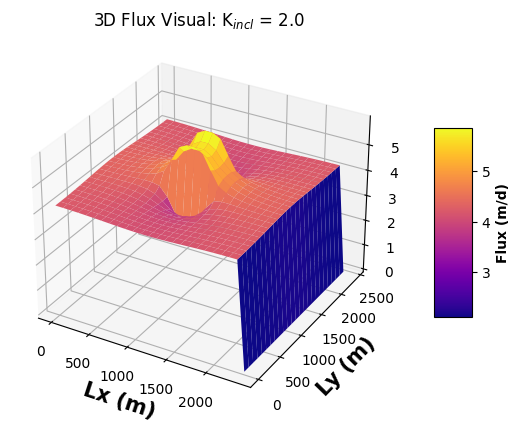

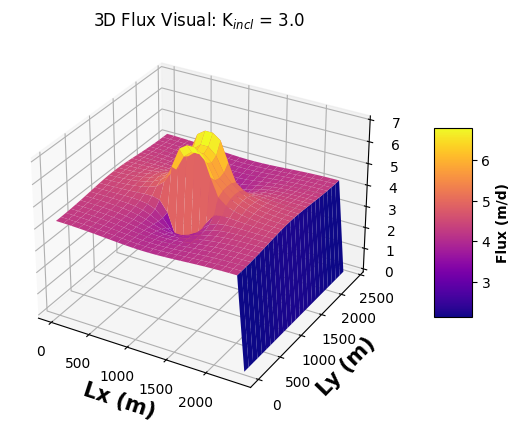

...

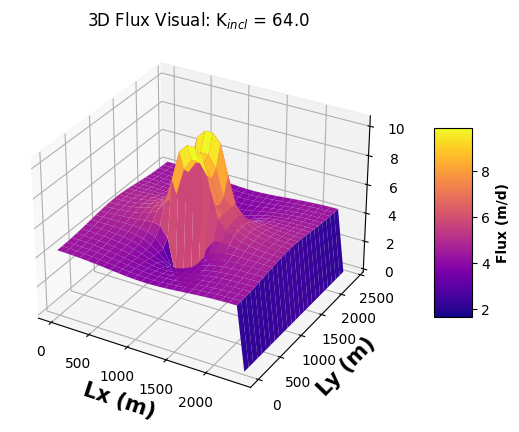

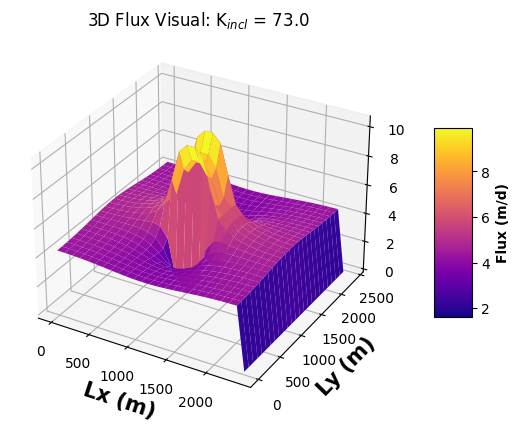

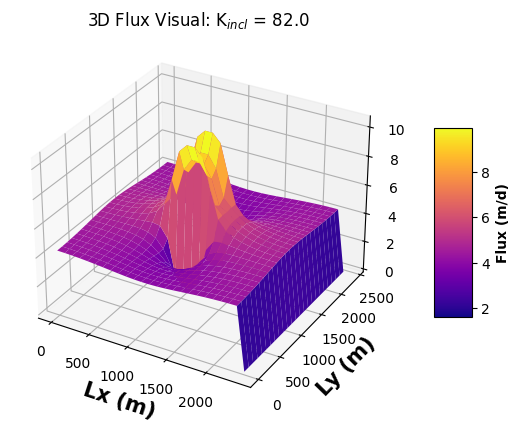

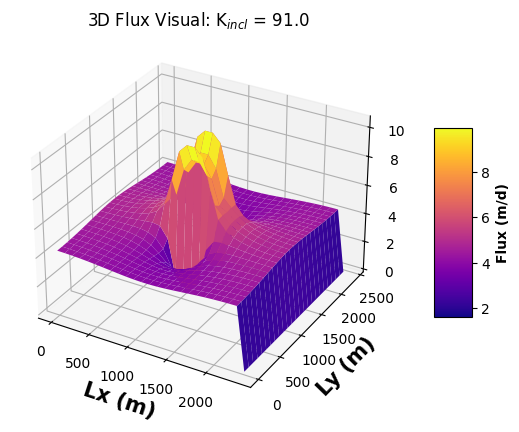

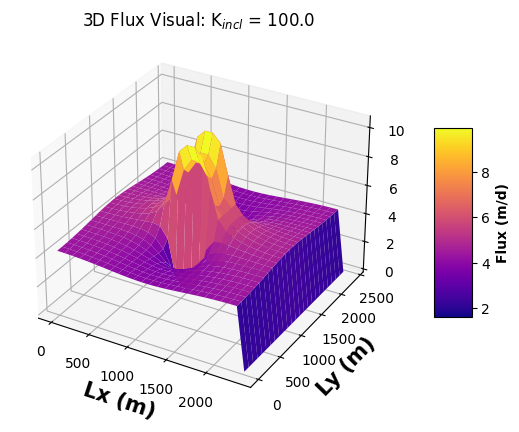

In [547]:
for model in model_names:
    q_3d = plt.figure(figsize=(12,5),dpi=100,facecolor='w')
    qax = q_3d.gca(projection='3d')
    X = np.arange(0,Lx-100,dx-1)
    Y = np.arange(0,Ly,dy)
    X, Y = np.meshgrid(X, Y)
    qZ = flux_dict[model].copy()
    q_surf = qax.plot_surface(X,Y,qZ,cmap='plasma',linewidth=0,label='flux')
    q_3d.colorbar(q_surf,shrink=0.5,aspect=5).set_label(r'Flux (m/d)',fontsize=10,fontweight='bold')
    qax.set_xlabel('Lx (m)', fontsize=15, fontweight='bold')
    qax.set_ylabel('Ly (m)', fontsize=15, fontweight='bold')
    qax.set_title(r'3D Flux Visual: K$_{incl}$ = '+'{}'.format(K_incl[model_names.index(model)]))
    plt.show()

Row #: 5
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m
Head Gradient 0.004 m/m


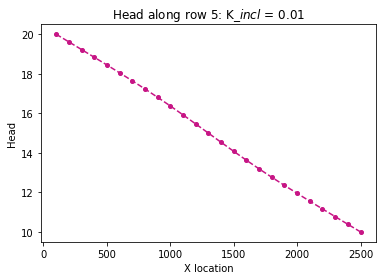

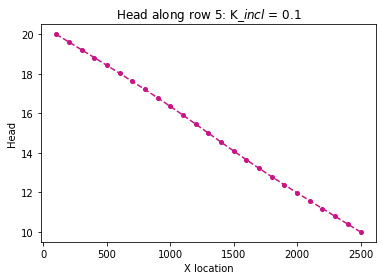

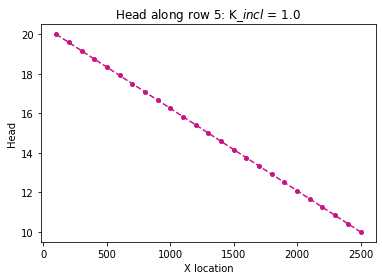

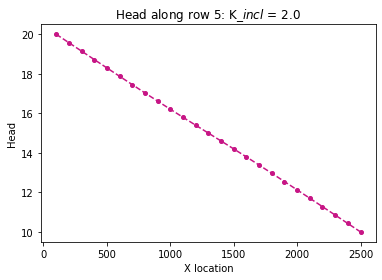

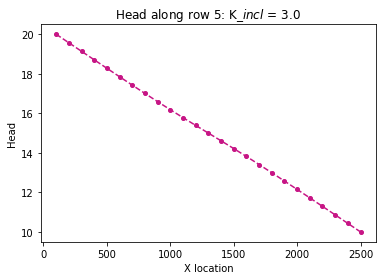

...

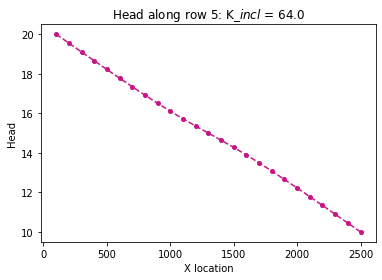

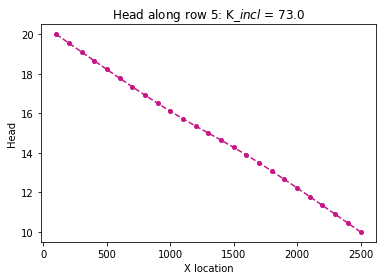

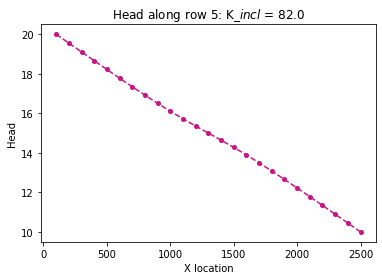

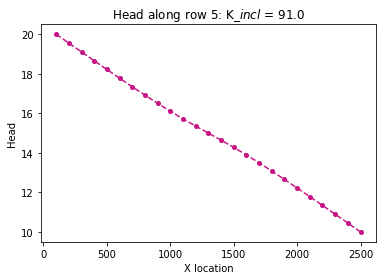

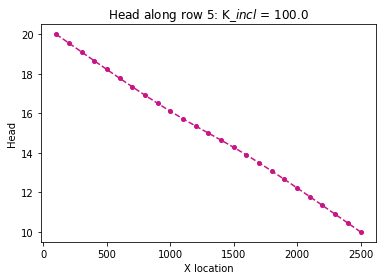

In [500]:
row = int(input('Row #: '))

for model in model_names:
    head_fig = plt.figure() 
    x=np.arange(100,2600,100) 
    y=head_dict[model][0,row,:]
    plt.plot(x,y,marker='o', color='mediumvioletred', markersize=4, linestyle='--')
    plt.xlabel('X location')
    plt.ylabel('Head')
    plt.title(r"Head along row {}:".format(row)+" K_${incl}$ = "+"{}".format(K_incl[model_names.index(model)]))
    #plt.axvline(x=1200)

    #Save figure
    # plt.savefig('Head_Transect.png') #save figure as a png

    hgrad=(head_dict[model][0,row,0]-head_dict[model][0,row,-1])/Lx
    print("Head Gradient", hgrad, "m/m") 

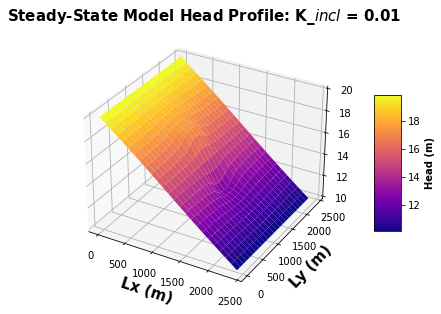

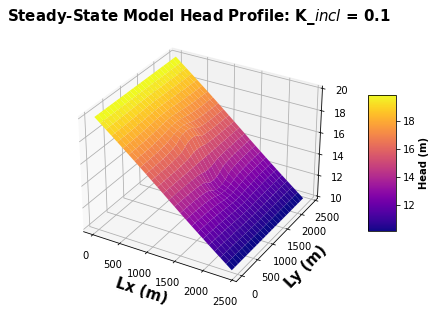

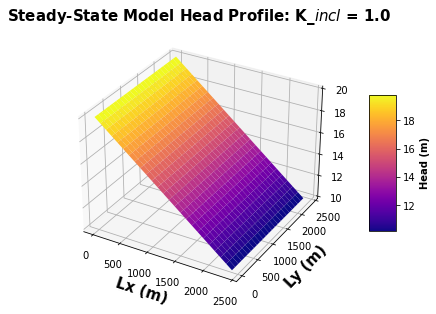

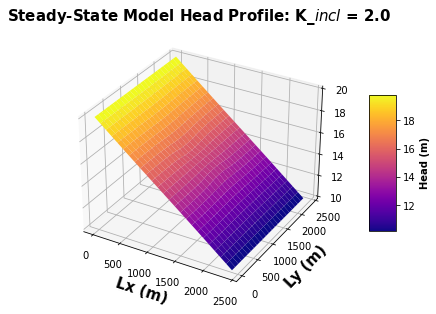

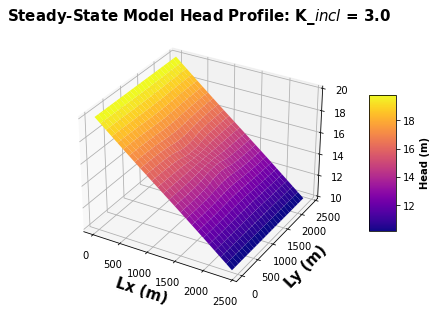

...

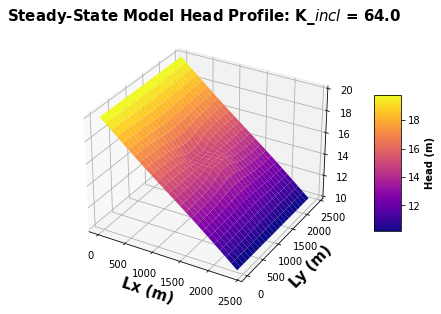

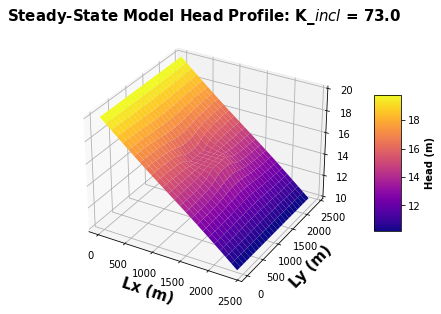

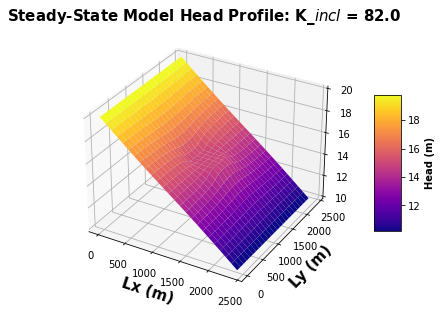

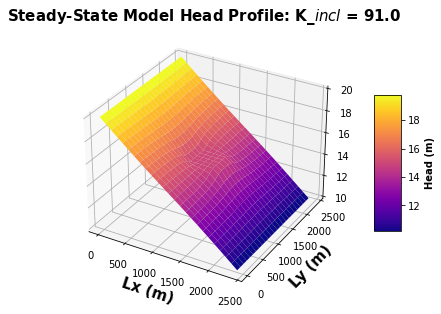

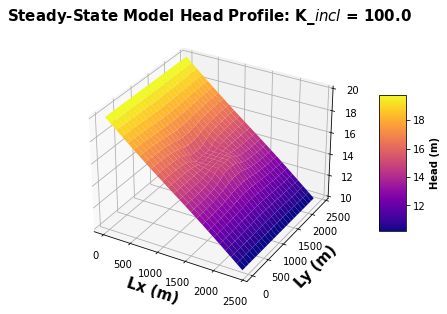

In [501]:

X = np.arange(0,Lx,dx)
Y = np.arange(0,Ly,dy)
X, Y = np.meshgrid(X, Y)

for model in model_names:

    #create 3d figure
    fig_3d = plt.figure(figsize=(12,5))
    ax = fig_3d.gca(projection='3d')

    #set X, Y, Z variables for 3d plot to be our model domain and head solution
    Z = np.flipud(head_dict[model][0])

    #create surface and labels
    surf = ax.plot_surface(X,Y,Z, cmap = 'plasma', linewidth=0, label='head')
    fig_3d.colorbar(surf,shrink=0.5,aspect=5).set_label('Head (m)',fontsize=10,fontweight='bold')
    ax.set_xlabel('Lx (m)', fontsize=15, fontweight='bold')
    ax.set_ylabel('Ly (m)', fontsize=15, fontweight='bold')
    ax.set_title('Steady-State Model Head Profile: K_${incl}$ = '+'{}'.format(K_incl[model_names.index(model)]), fontsize=15, fontweight='bold')
    # plt.savefig('BoxModel_Surface1.png') 
    plt.show(surf)

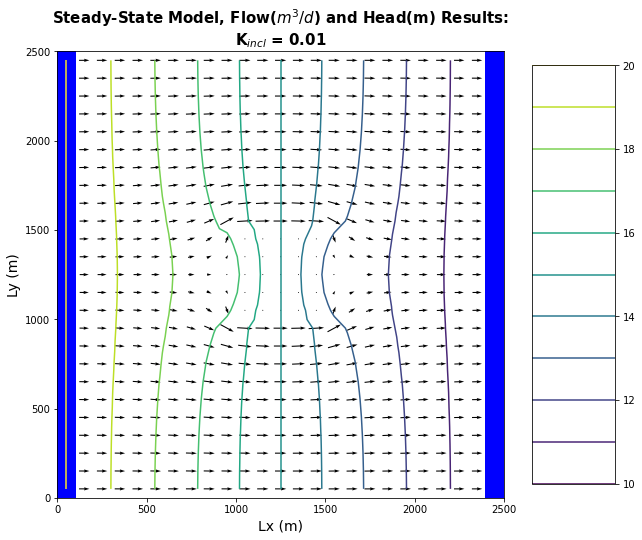

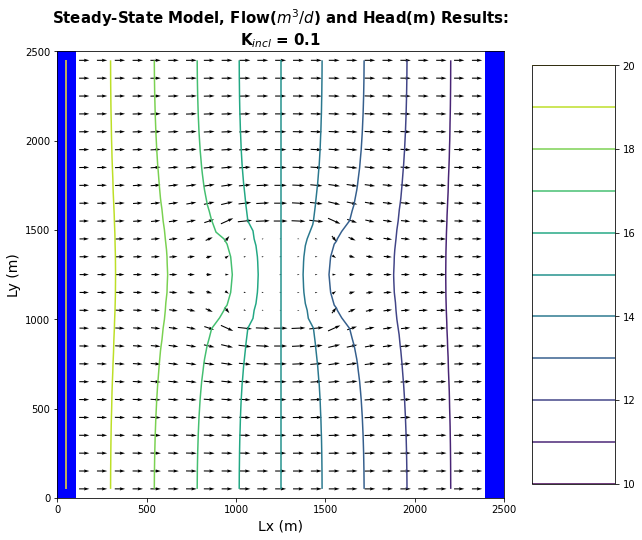

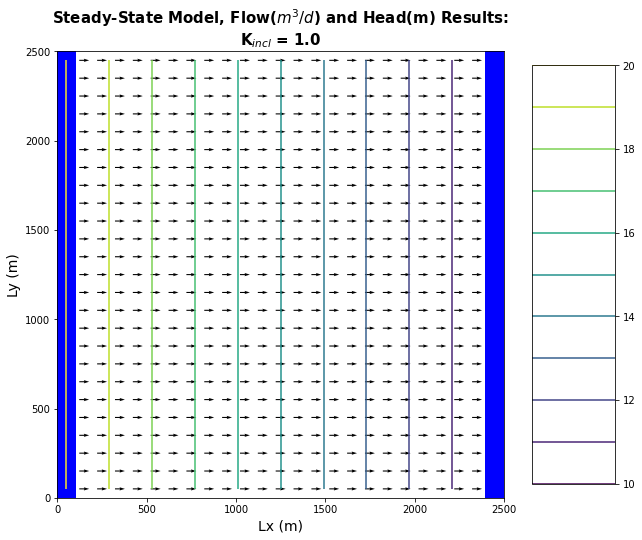

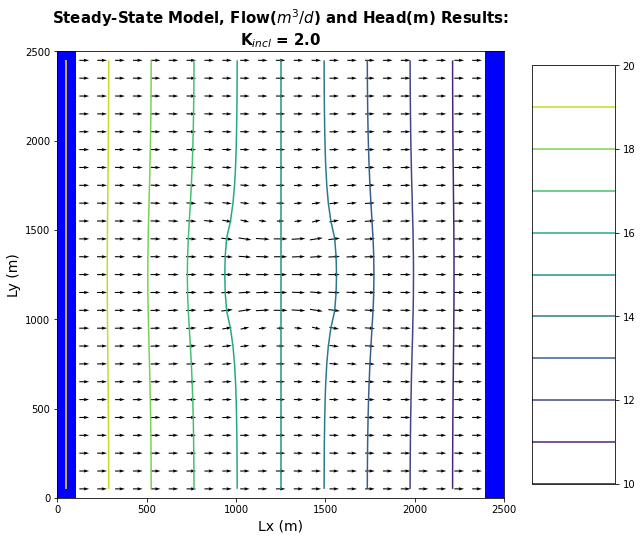

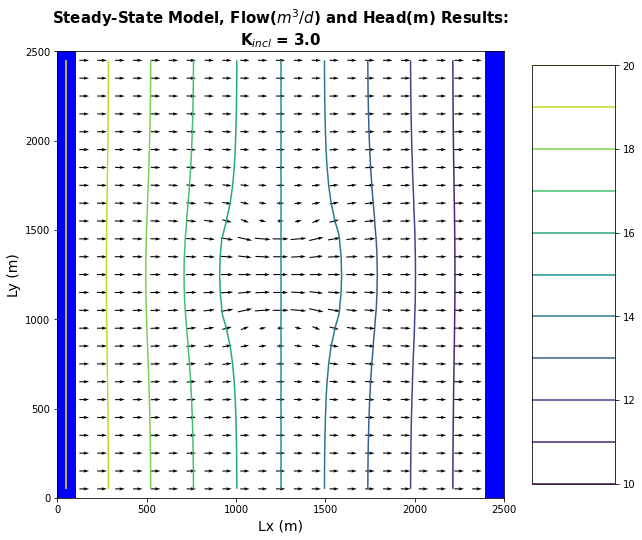

...

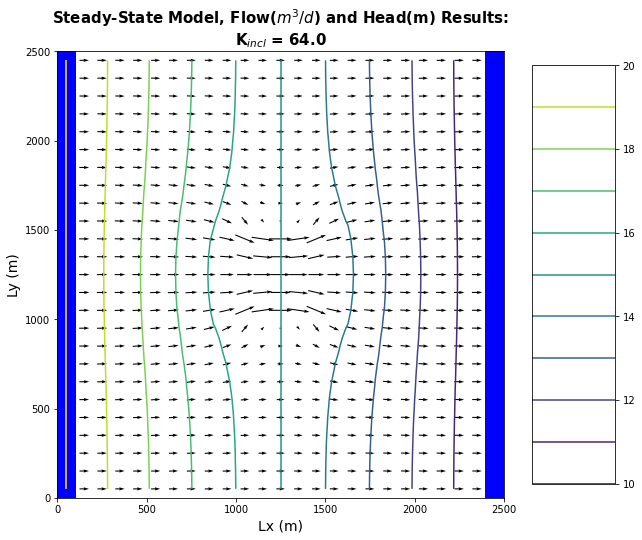

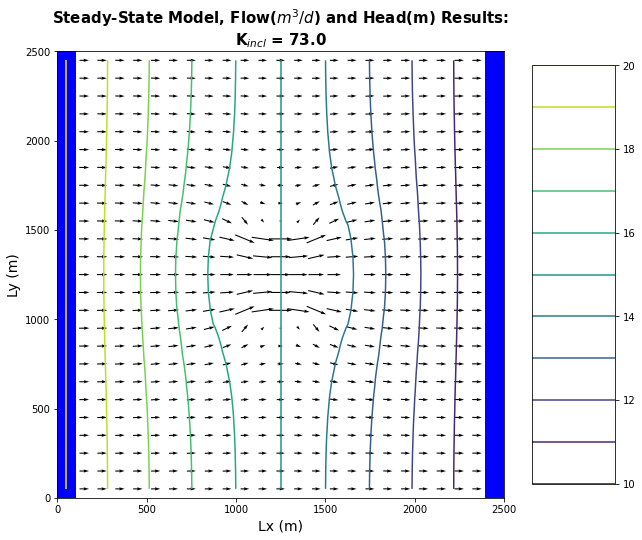

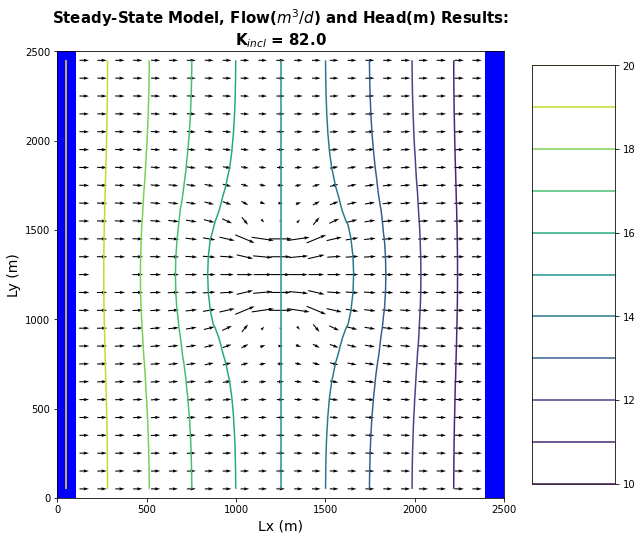

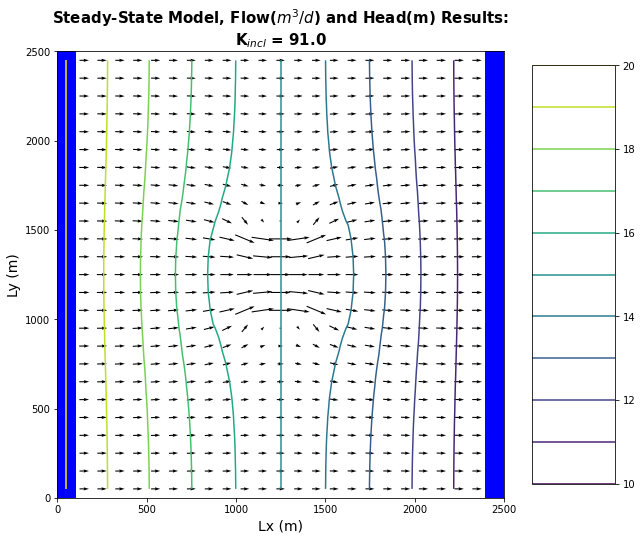

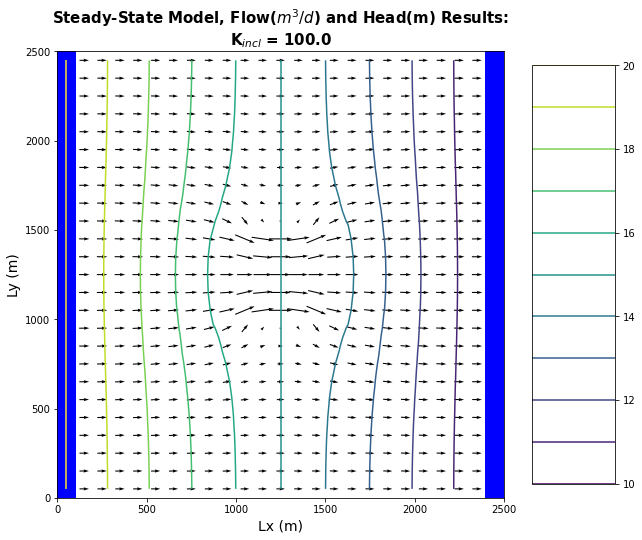

In [502]:
for model in model_names:
    m = mod_dict[model]
    #plot first contour plot
    fig1 = plt.figure(figsize=(10,10)) #create 10 x 10 figure
    modelmap = flopy.plot.PlotMapView(model=m, layer=0) #use modelmap to attach plot to model
    #grid = modelmap.plot_grid() #plot model grid
    qm = modelmap.plot_ibound()  
    contour_levels = np.linspace(head_dict[model][0].min(),head_dict[model][0].max(),11) #set contour levels for contouring head
    head_contours = modelmap.contour_array(head_dict[model], levels=contour_levels) #create head contours
    flows = modelmap.plot_discharge(frf_dict[model][0], fff_dict[model][0], head=head_dict[model]) #create discharge arrows

    #display parameters
    plt.xlabel('Lx (m)',fontsize = 14)
    plt.ylabel('Ly (m)',fontsize = 14)
    plt.title(r'Steady-State Model, Flow($m^3/d$) and Head(m) Results:'+'\n'+r'K$_{incl}$ = '+'{}'.format(K_incl[model_names.index(model)]), fontsize = 15, fontweight = 'bold')
    plt.colorbar(head_contours,aspect=5)
    # plt.savefig('BoxModel_vectors.png')   
    plt.show(modelmap)

## $K_{eq}$ : The Mean Stuff

In [538]:
#Build DataFrame for storage of Keq's
Kin_list = ['K_incl']*len(K_incl)
Kin_array = [Kin_list,K_incl]
df_Keq_ind = pd.MultiIndex.from_arrays(Kin_array)
columns = ['Harmonic','Arithmetic','2D']
df_Keq = pd.DataFrame(index=df_Keq_ind,columns=columns)
#df_Keq.style.set_properties(subset=['K_incl'], **{'text-align': 'center'})
#df_Keq.style

# Harmonic

In [539]:
def Keq_harm(K1,K2,A1,A2):
    A_tot = A1 + A2
    Keq = A_tot/((A1/K1)+(A2/K2))
    return Keq

In [540]:
A_sys = (dx*ncol)*(dy*nrow)
A_incl = (dx*5)*(dy*5)
A_homo = A_sys-A_incl
print('Total Area = {} \nArea Inclusion = {} \nArea Homogenous = {}'.format(A_sys,A_incl,A_homo))

Total Area = 6250000 
Area Inclusion = 250000 
Area Homogenous = 6000000


In [541]:
for K in K_incl:
    df_Keq.loc[('K_incl',K),'Harmonic'] = round(Keq_harm(K,K_horiz,A_incl,A_homo),3)
df_Keq.style

# Arithmetic

In [542]:
def Keq_arith(K1,K2,A1,A2):
    A_tot = A1 + A2
    Keq = (K1*A1 + K2*A2)/A_tot
    return Keq

In [543]:
for K in K_incl:
    df_Keq.loc[('K_incl',K),'Arithmetic'] = round(Keq_arith(K,K_horiz,A_incl,A_homo),3)
df_Keq.style

# 2D $K_{eq}$

In [544]:
for model in model_names:
    #leftflux = flux_dict[model][:,0]
    sum_q = np.sum(flux_dict[model][:,-2])
    #cenflux = flux_dict[model][:,13]
    Keq_d = (sum_q/(nrow*dy))*24
    df_Keq.loc[('K_incl',K_incl[model_names.index(model)]),'2D'] = Keq_d
df_Keq.style

# Plots

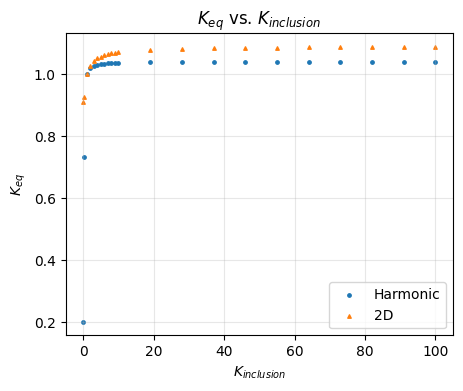

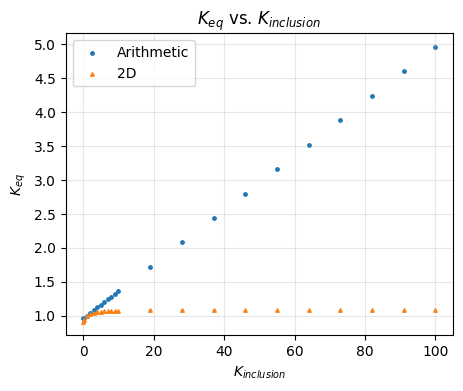

In [546]:
mean_lbl = ['Harmonic','Arithmetic']
for col in mean_lbl:
    fig,ax = plt.subplots(1,figsize=(5,4),dpi=100,facecolor='w')
    ax.scatter(K_incl,df_Keq.loc[:,col],label=col,s = 6)
    ax.scatter(K_incl,df_Keq.loc[:,'2D'],label='2D',s=6,marker='^')
    ax.set_ylabel(r'$K_{eq}$')
    ax.set_xlabel(r'$K_{inclusion}$')
    ax.grid('both',alpha=0.3)
    ax.set_title(r'$K_{eq}$ vs. $K_{inclusion}$')
    plt.legend(fontsize=10)
    plt.show()